<img width="400" src="https://nomeroff.net.ua/images/logo/nomeroff_net.svg" alt="Nomeroff Net. Automatic numberplate recognition system" align="left"/>

## The example demonstrates license plate number detection.

Before runing this demo, please download models from [https://nomeroff.net.ua/models/](https://nomeroff.net.ua/models/) to **./models/** directory. 

In [1]:
#Specify device
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "" 
os.environ["TF_FORCE_GPU_ALLOW_GROWTH"] = "true"

In [2]:
# Import all necessary libraries.
import numpy as np
import sys
import glob
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2
import copy

# NomeroffNet path
NOMEROFF_NET_DIR = os.path.abspath('../')
sys.path.append(NOMEROFF_NET_DIR)

In [3]:
from NomeroffNet.YoloV5Detector import Detector

detector = Detector()
detector.load()

/usr/local/lib64/python3.8/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx (Triggered internally at  /pytorch/c10/cuda/CUDAFunctions.cpp:100.)
  return torch._C._cuda_getDeviceCount() > 0


In [4]:
from NomeroffNet.BBoxNpPoints import NpPointsCraft, getCvZoneRGB, convertCvZonesRGBtoBGR, reshapePoints

npPointsCraft = NpPointsCraft()
npPointsCraft.load()

Loading weights from checkpoint (/mnt/data/var/www/nomeroff-net/NomeroffNet/Base/mcm/./data/./models/NpPointsCraft/craft_mlt/craft_mlt_25k_2020-02-16.pth)
Loading weights of refiner from checkpoint (/mnt/data/var/www/nomeroff-net/NomeroffNet/Base/mcm/./data/./models/NpPointsCraft/craft_refiner/craft_refiner_CTW1500_2020-02-16.pth)


In [5]:
from NomeroffNet.OptionsDetector import OptionsDetector
from NomeroffNet.TextDetector import TextDetector

optionsDetector = OptionsDetector()
optionsDetector.load("latest")

# Initialize text detector.
textDetector = TextDetector({
    "eu_ua_2004_2015": {
        "for_regions": ["eu_ua_2015", "eu_ua_2004"],
        "model_path": "latest"
    },
    "eu_ua_1995": {
        "for_regions": ["eu_ua_1995"],
        "model_path": "latest"
    },
    "eu": {
        "for_regions": ["eu"],
        "model_path": "latest"
    },
    "ru": {
        "for_regions": ["ru", "eu-ua-fake-lnr", "eu-ua-fake-dnr"],
        "model_path": "latest" 
    },
    "kz": {
        "for_regions": ["kz"],
        "model_path": "latest"
    },
    "ge": {
        "for_regions": ["ge"],
        "model_path": "latest"
    },
    "su": {
        "for_regions": ["su"],
        "model_path": "latest"
    }
})

In [6]:
%matplotlib inline
plt.rcParams["figure.figsize"] = (20,10)

[[[874.2659463550704, 570.1922326661966], [874.2659463550702, 512.3070921849654], [1081.7340664626477, 465.06188133235287], [1081.7340536449296, 522.9470250164579]]]


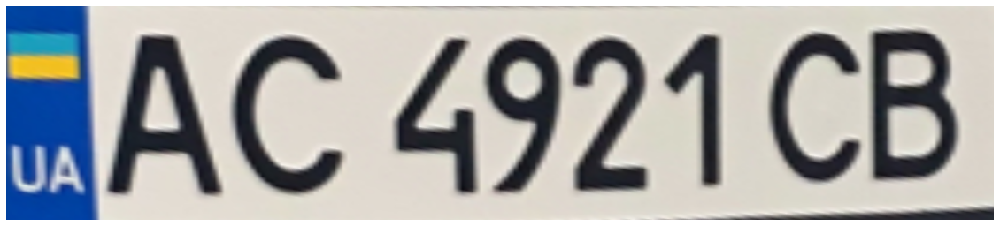

['eu_ua_2015']
[1]


/mnt/data/var/www/nomeroff-net/NomeroffNet/Base/nnmodels.py:48: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  x1 = functional.softmax(self.fc3_reg(x1))
/mnt/data/var/www/nomeroff-net/NomeroffNet/Base/nnmodels.py:55: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  x2 = functional.softmax(self.fc3_line(x2))


['AC4921CB']


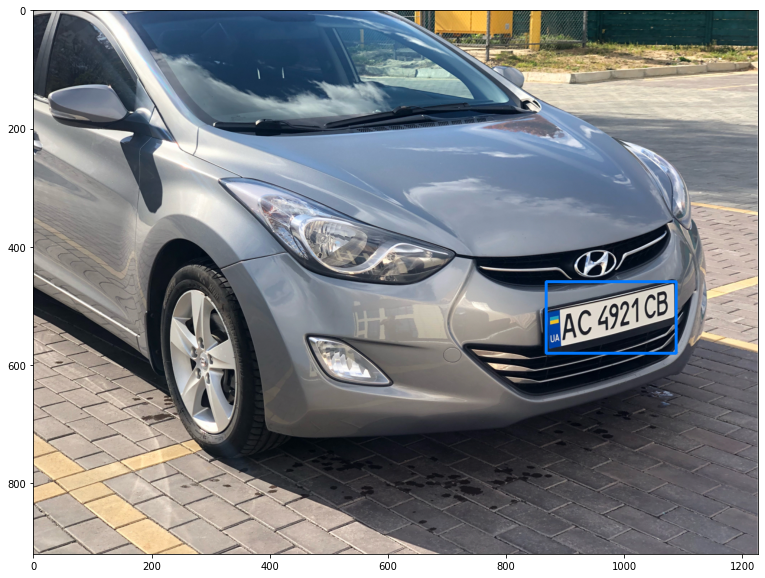

[[[1698.1789994197727, 1051.4800434585652], [1698.1789994197727, 998.2251350147698], [1789.741579467852, 922.8206602393473], [1789.7415824584175, 976.07556282889]]]


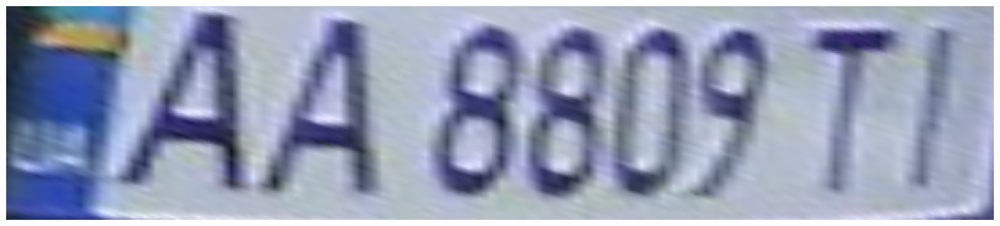

['eu_ua_2015']
[1]
['AA8809TI']


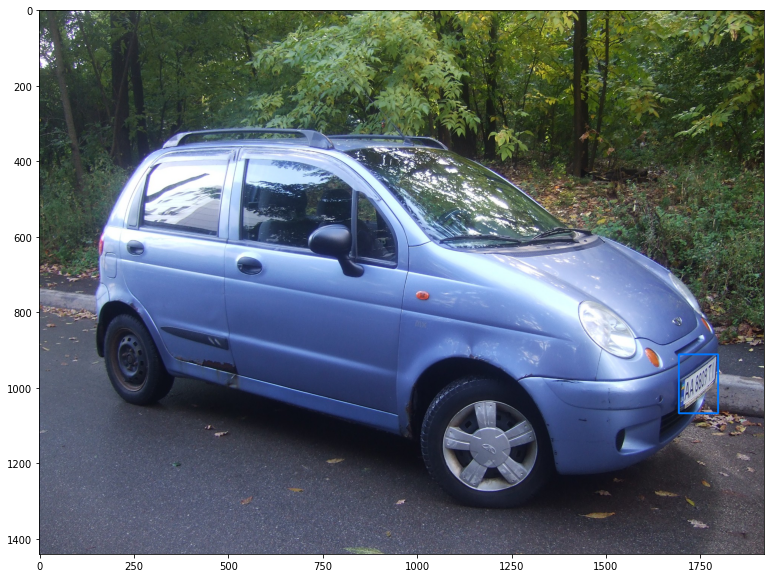

[[[844.0, 405.89333404541014], [844.0, 379.43999992370607], [947.0, 379.43999992370607], [947.0, 405.89333404541014]], [[428.8651628101511, 405.5917469934201], [428.0, 382.6649000041218], [526.1348324575771, 378.9617122885761], [527.0, 401.8885584452085]]]


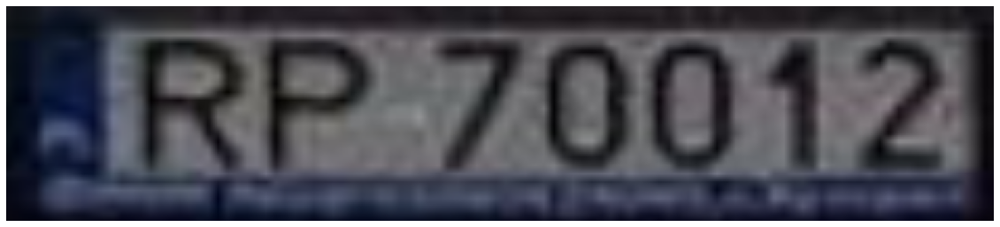

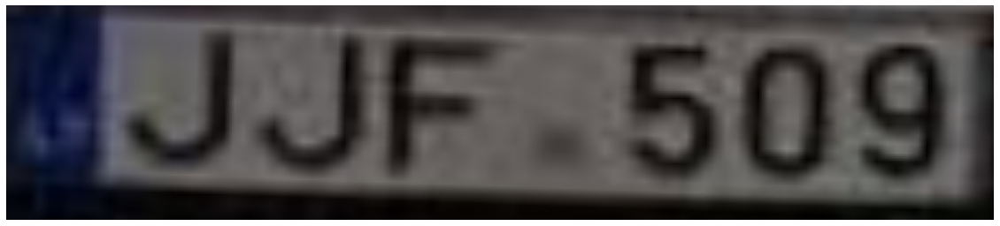

['eu', 'eu']
[1, 1]
['RP70012', 'JJF509']


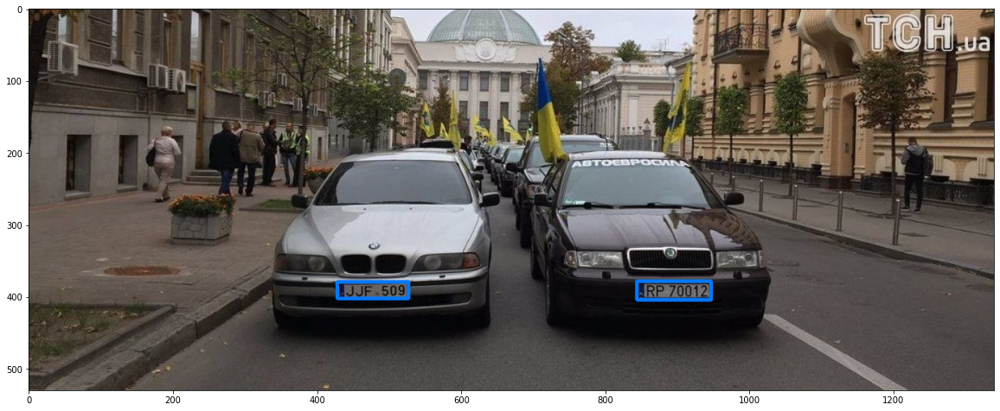

[[[192.0, 453.3200015848334], [192.00000236511232, 408.6799962639809], [277.0, 408.67999246418435], [277.0, 453.31999605785666]]]


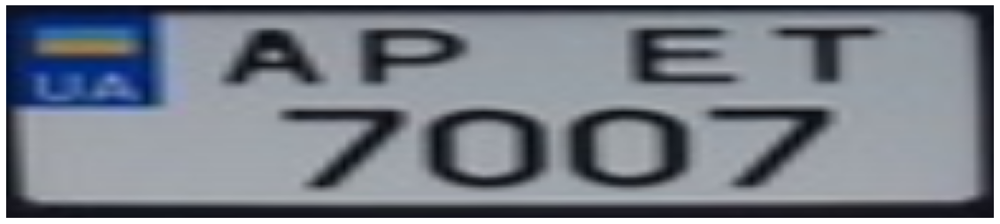

['eu_ua_2015']
[2]
['AE5177OT']


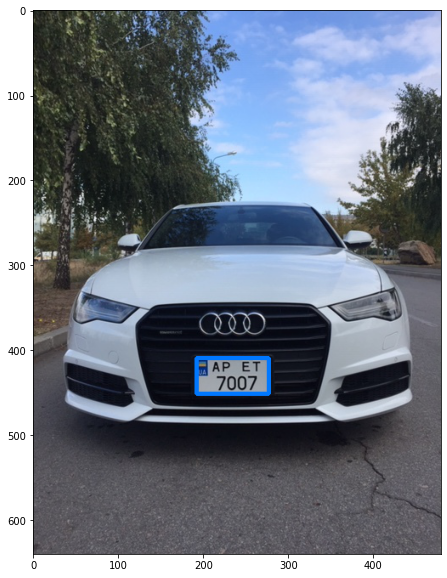

[[[348.94189473648146, 712.0620278320307], [348.94189473648146, 654.2312918210664], [592.0581052635185, 662.1589928475065], [592.0580733323733, 719.9897265586573]], [[161, 405], [161, 384], [211, 384], [211, 405]]]


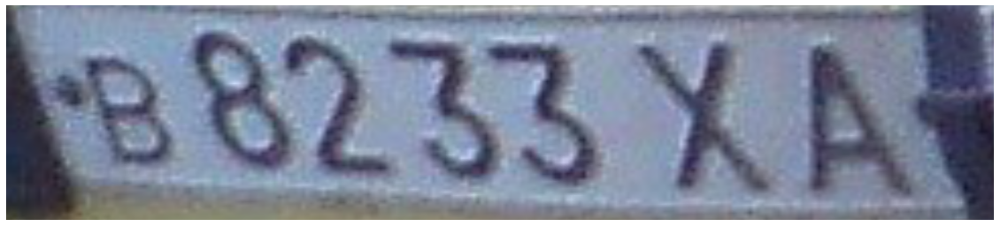

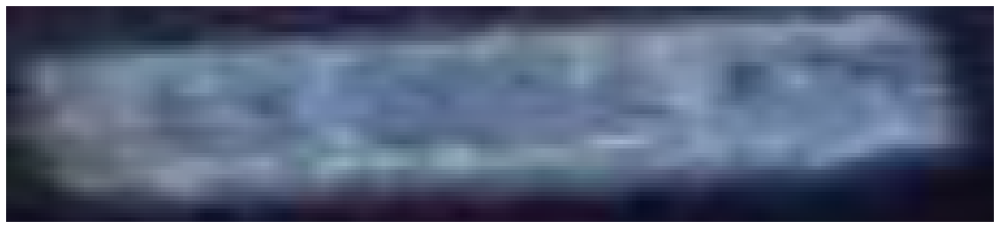

['su', 'xx_unknown']
[1, 0]
['В8233ХА', '']


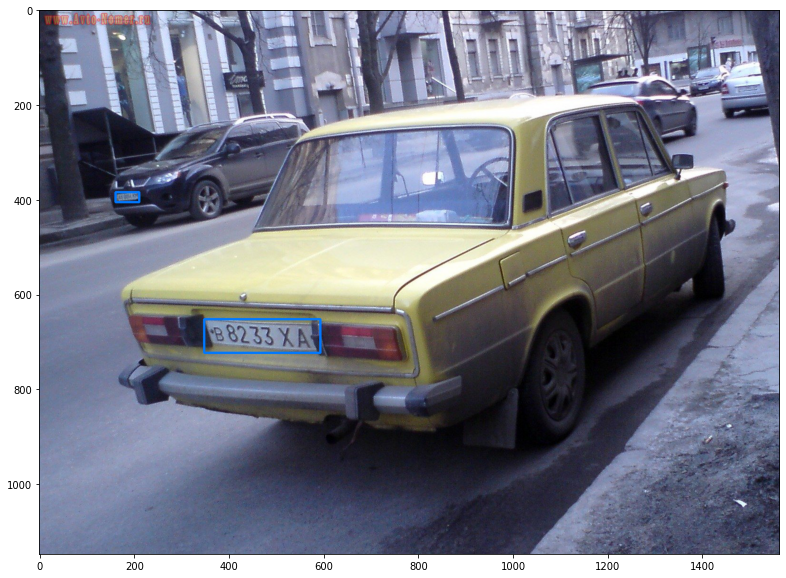

[[[284.0843344467319, 701.7483133393192], [284.0843344467319, 611.6392323180582], [410.05061234766873, 624.799888119159], [410.05061450504587, 714.9089737445349]]]


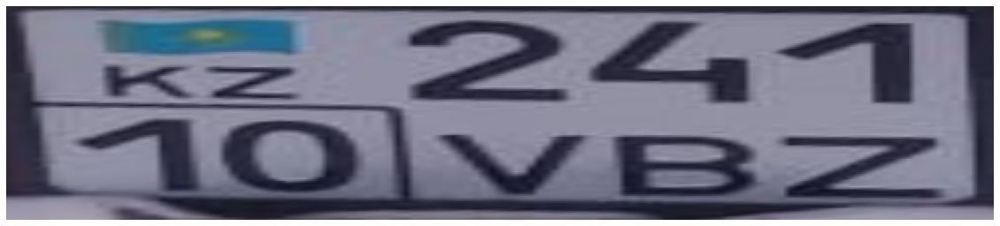

['kz']
[2]
['2411DVB2']


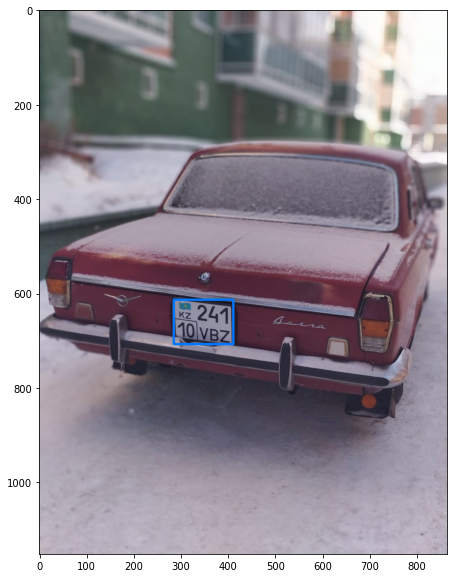

[[[1730.4889855958675, 1802.700648652868], [1715.0248880617912, 1638.4322755840562], [2591.5358739417757, 1555.9181947400252], [2607.0, 1720.1865504048424]]]


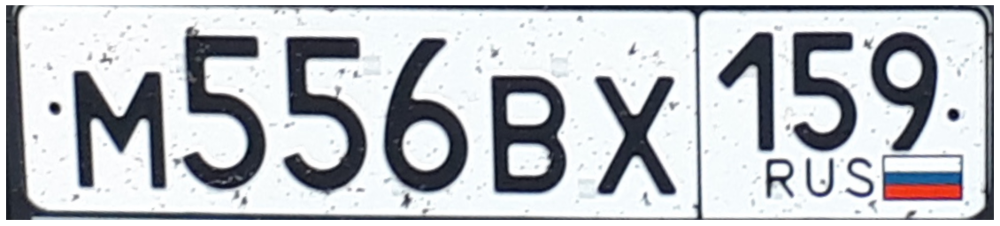

['ru']
[1]
['M556BX159']


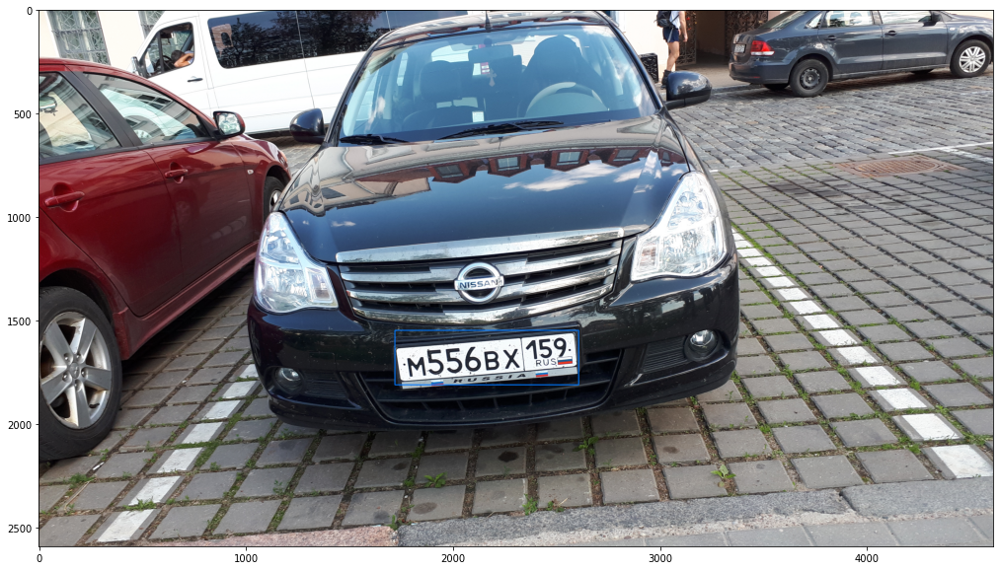

[[[166.79466874480238, 447.9306554545664], [166.79466874480238, 388.19733641726725], [305.46666461348536, 457.53333435160874], [305.46666950821873, 517.2666462697291]]]


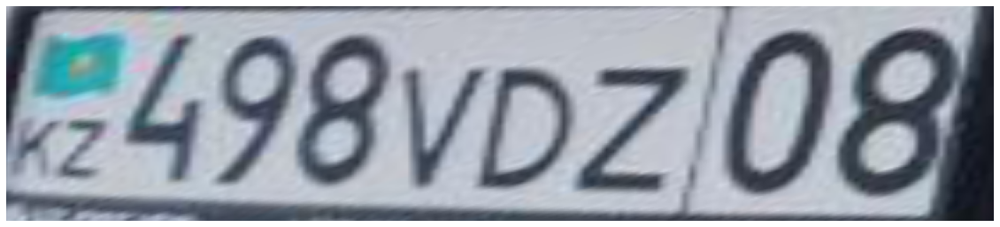

['kz']
[1]
['498VDZ08']


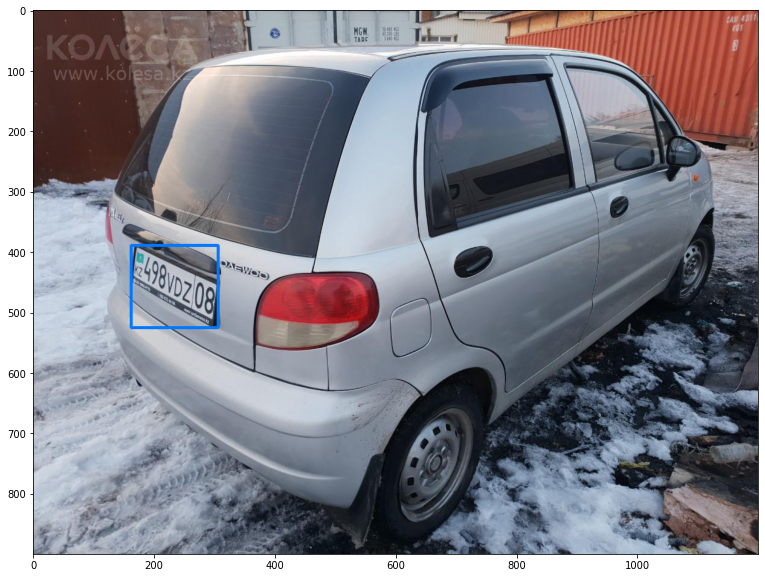

[[[642.0, 496.19999992370606], [642.0, 463.133333568573], [799.0, 463.133333568573], [799.0, 496.19999992370606]], [[972, 270], [972, 247], [1000, 247], [1000, 270]], [[256, 164], [256, 155], [287, 155], [287, 164]]]


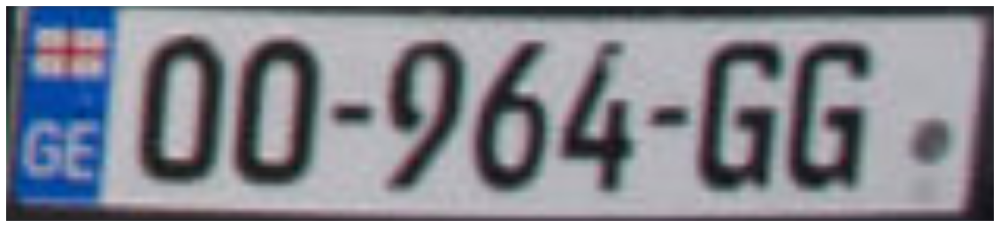

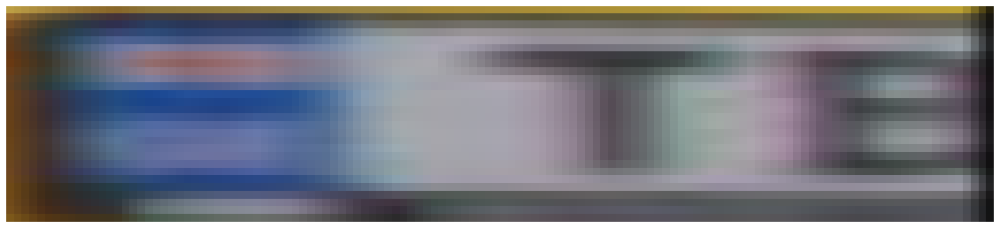

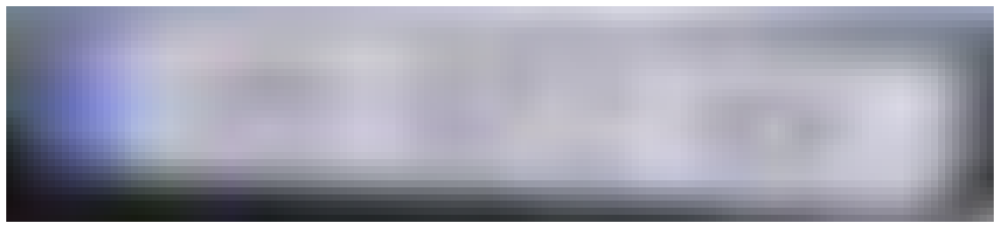

['ge', 'eu_ua_2015', 'xx_unknown']
[1, 0, 0]
['00964GG', 'BAITAE', '']


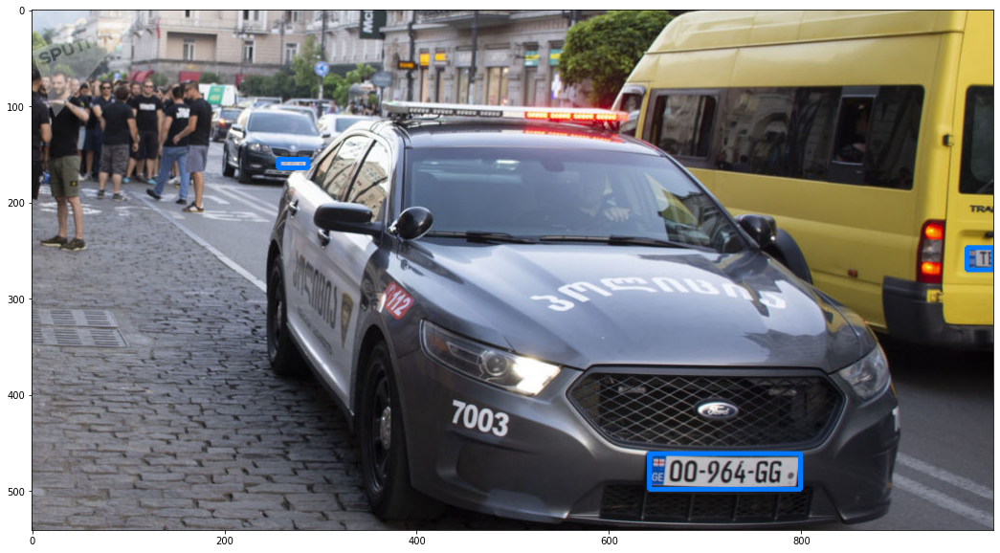

In [7]:
rootDir = 'images/*'

imgs = [mpimg.imread(img_path) for img_path in glob.glob(rootDir)]

for img in imgs:
    targetBoxes = detector.detect_bbox(copy.deepcopy(img))
    targetBoxes = targetBoxes

    all_points = npPointsCraft.detect(img, targetBoxes)
    all_points = [ps for ps in all_points if len(ps)]
    print(all_points)

     # cut zones
    toShowZones = [getCvZoneRGB(img, reshapePoints(rect, 1)) for rect in all_points]
    zones = convertCvZonesRGBtoBGR(toShowZones)
    for zone, points in zip(toShowZones, all_points):
        plt.axis("off")
        plt.imshow(zone)
        plt.show()

    # find standart
    regionIds, countLines = optionsDetector.predict(zones)
    regionNames = optionsDetector.getRegionLabels(regionIds)
    print(regionNames)
    print(countLines)

    # find text with postprocessing by standart  
    textArr = textDetector.predict(zones, regionNames, countLines)
    print(textArr)
    
    # draw rect and 4 points
    for targetBox, points in zip(targetBoxes, all_points):
        cv2.rectangle(img, 
                      (int(targetBox[0]), int(targetBox[1])), 
                      (int(targetBox[2]), int(targetBox[3])), 
                      (0,120,255), 
                      3)
    plt.imshow(img)
    plt.show()